# 1 Author

**Student Name**: Anushree Vishnoi
**Student ID**: 220756349

# 2 Problem formulation

**Dataset used** - MLEnd London Sounds
Collection of 7 secs audio recording from multiple outdoor and indoor locations in London

Machine learning problem description/Objective -
**INPUT** an audio segment (independent variable) and predict whether the audio segment has been recorded indoor or outdoor (dependent variable) which is the **OUTPUT** for the problem.


**Uniqueness of the problem** - It helps to recognize the accoustic environment (indoor-outdoor location) from the available audio recordings.



# 3 Machine learning pipeline

- Collection of audio recording
- Production of the data samples
- Dowloading and loading of dataset
- Understanding and uploading the datset sample.
- Problem formulation - To recognise the filming spot - accoustic environment
- MLEndLS dataset is a collection of samples described by 5 attributes:Audio file, Area, Spot, Audio recording indoor or outdoor and Participant (ID of the person who recorded the audio spot)
- Extracting feature
- Building different models to test and evaluate data to get the training and validation accuracy
- Checking the performance and scaling predictors for comparison
- Result
- Conclusion




# 4 Transformation stage

- Using the  complete data samples 2500
- Attributes:


1.   File id (Audio)
2.   Area (place where the audio was recorded)
3.   Spot (Excat spot of recording)
4.   Indoor/Outdoor (Whether the audio was recorded indoor or outdoor)
5.   Participant (uniqueID)

This is the basic csv file provided for analysis. We further extract audio files from the the above attributes to help the model predict more precisely.

This is because the raw audio files have multiple dimensions which can be very challenging while predicting. The **audio features** extracted are:

- Extracting audio feature


1.   **Power**: Intensity of sound. To identify the section of the signal that are significantly louder or quieter.
2.   **Pitch** - **Mean**: Mean of te sound wave
3.   **Pitch** - **Standard Deviation**: Standard Deviation of frequency of sound waves.
4.   **Fraction of voiced region** - Proportion of signal that contains periodic patterns as opposed to random patterns.


-  Defining a function using the 4 audio features which are used as the predictors (X) and a binary label (y) that indicates whether the recording is indoors (y=1) or outdoors (y=0)
- This would result in a numpy array of the 4 features and binary label of the filming locations as indoor and outdoor. Passing the function through all the samples to ge the filming locations.


**Scaling** is bringing the features of the dataset to as single scale by removing the mean and scaling to unit variance. This is done because most of the machine learning models assume that the features are in the same scale and is normally distrbuted. To make the model work more efficiently, we need to scale down the features to the same scale before working on them.



# 5 Modelling
The problem statement depicts a binary class Classification problem.

The first model used is SVM (Support Vector Machine).

Why SVM?

SVM can easily handle high-dimensional data which is essential for our dataset. In this model, the distance between the nearest points of each class and the hyperplane is maximized which prevents overfitting in case of new data. They also work well with large number of features.

The second model used is Random Forest.

Why Random Forest?

In general, Ensemble models perform better than individual models. Most commonly used Ensemble model is Random Forest which is built based on decision trees as individual models. They can also handle high dimensional data efficiently while taking up less computation time. They are relatively resisatnt to overfitting also.

Why XGBoost?

XGBoost is better suited for large scale datasets and real time applications. It is flexible for different types of data and is good at identifying the most important features for making predictions.

Based on the performance of each of the model after using other optimization techniques, we select one model that performs well on all aspects.




# 6 Methodology


Evaluated the training and validation accuracy scores using all the three metgods - SVM, RF, XGBoost with and without scaling keeping a check on the overfitting and fitting.


# Environment set up -  MLEnd mini-project


Creating a folder named 'MLEndLS' in 'Data' in 'MyDrive' on https://drive.google.com/

Loading a few useful Python libraries and mounting personal Google Drive storage system (i.e. making it available, so that Colab can access it).

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data download

In this section we have downloaded the 2500 audio samples of the MLEnd London Sounds Dataset.

The file was downloaded from a given loaction and then uploaded in MyDrive in MLEndLS folder as a zip file.

The next step is to download the file 'MLEndLS.zip' into the folder 'MyDrive/Data/MLEndLS'.

Ran the following cell to check that the MLEndLS folder contains the file 'MLEndLS.zip':

In [4]:
path = '/content/drive/MyDrive/Data/MLEndLS'
os.listdir(path)

['sample', 'MLEndLS.zip', 'MLEndLS.csv']

# 7. All about the dataset sample

Let's unzipping the sample data:

In [5]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/sample/'
zip_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)



And now checking the number of audio files we have:

In [6]:
sample_path = '/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS/*.wav'
files = glob.glob(sample_path)
len(files)

2500

This figure (2500) corresponds to the number of **items** or **samples** in our dataset. Let's listen to some random audio files:

In [7]:
for _ in range(5):
  n = np.random.randint(13)
  display(ipd.Audio(files[n]))

Problem formulation - recognising the filming spot - acoustic environment

The MLEndLS Dataset is a collection of samples described by 5 attributes:
- Audio
- Area
- Spot
- Whether indoor or outdoor
- Participant

Defining the patch of the CSV file 'MLEndLS.csv'. Then converting the .csv file in the next cell to load it into a Pandas DataFrame and print its contents.


In [8]:
csv_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS.csv'

In [9]:
MLENDLS_df = pd.read_csv(csv_path).set_index('file_id')
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


The audio attribute is a complex one and cannot be directly inserted in a DataFrame structure. Instead, we have the name of the corresponding audio files, e.g. '3086.wav', which in our case are stored in the '/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS_Sample/' folder.

The next cell prints the contents of the folder that stores our sample audio files. The names of the WAV files correspond to one of the `file_id` entries in the `MLEndLS_df` DataFrame.

In [10]:
for file in files:
  print(file.split('/')[-1])

1501.wav
1503.wav
1502.wav
1504.wav
1505.wav
1508.wav
1506.wav
1507.wav
1509.wav
1511.wav
1510.wav
1512.wav
1513.wav
1514.wav
1516.wav
1515.wav
1517.wav
1518.wav
1519.wav
1520.wav
1521.wav
1525.wav
1523.wav
1522.wav
1524.wav
1526.wav
1529.wav
1527.wav
1528.wav
1530.wav
1531.wav
1532.wav
1533.wav
1534.wav
1538.wav
1536.wav
1535.wav
1537.wav
1539.wav
1540.wav
1541.wav
1542.wav
1543.wav
1544.wav
1545.wav
1546.wav
1547.wav
1548.wav
1549.wav
1551.wav
1552.wav
1550.wav
1553.wav
1557.wav
1554.wav
1556.wav
1555.wav
1559.wav
1560.wav
1558.wav
1562.wav
1561.wav
1563.wav
1564.wav
1565.wav
1566.wav
1567.wav
1568.wav
1569.wav
1570.wav
1571.wav
1572.wav
1573.wav
1576.wav
1575.wav
1574.wav
1578.wav
1577.wav
1579.wav
1580.wav
1581.wav
1582.wav
1583.wav
1585.wav
1584.wav
1586.wav
1587.wav
1588.wav
1589.wav
1591.wav
1590.wav
1593.wav
1592.wav
1595.wav
1594.wav
1596.wav
1597.wav
1598.wav
1599.wav
1600.wav
1604.wav
1603.wav
1602.wav
1601.wav
1606.wav
1608.wav
1607.wav
1605.wav
1609.wav
1610.wav
1611.wav
1

# Feature extraction : Pitch

Audio files are complex data types. Specifically they are **discrete signals** or **time series**, consisting of values on a 1D temporal grid. These values are known as *samples* themselves, which might be a bit confusing, as we have used this term to refer to the *items* in our dataset. The **sampling frequency** is the rate at which samples in an audio file are produced. For instance a sampling frequency of 5HZ indicates that 5 samples are captured per second, or 1 sample every 0.2 s.

Plotting one of our audio signals:

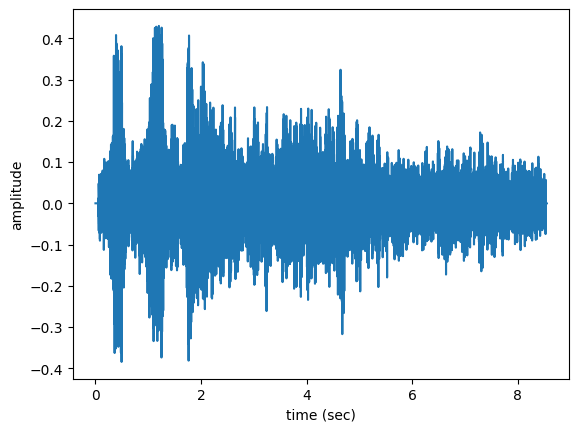

In [11]:
n=92
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

Checking if the indoors or outdoors location matches with the values shown in the ``` MLENDLS_df ``` dataframe


In [12]:
MLENDLS_df.loc[files[n].split('/')[-1]]

,1592.wav
area,Euston
spot,forecourt
in_out,outdoor
Participant,S90


Note that we are using the name of the audio file as the index in the Pandas DataFrame. By changing the value of `n` in the previous cell, we can listen to other examples.

Reviewing complex audio signals. looking at the number of samples (i.e. time series samples) in one of our audio files:

In [13]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 324576 samples


Since we are using raw audio signal as the input of a machine learning model, we will be operating in a predictor space consisting of hundreds of thousands of dimensions. Comparing this figure with the number of items (i.e. recordings) that we have. Since we do not have enough samples to train a model that takes one of these audio signals as an input we shall take a different approach.

One approach to deal with this huge dimensionality is to extract a few features from the signals and use those features as predictors instead. In this notebook we will use four audio features, namely:


1.   Power.
2.   Pitch - mean.
3.   Pitch - standard deviation.
4.   Fraction of voiced region.

In the next cell, we define a new function that gets the pitch of an audio signal

In [14]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

Consider the problem of determining whether the filming spot is indoors or outdoors. Then next cell defines a function that takes a collection of audio files together with a CSV file and creates a NumPy array containing the 4 audio features used as predictors (`X`) and a binary label (`y`) that indicates whether the recording is indoors (`y=1`) or outdoors (`y=0`).

In [15]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    try:
      fileID = file.split('/')[-1]
      file_name = file.split('/')[-1]
      yi = labels_file.loc[fileID]['in_out']=='indoor'

      fs = None # if None, fs would be 22050
      x, fs = librosa.load(file,sr=fs)
      if scale_audio: x = x/np.max(np.abs(x))
      f0, voiced_flag = getPitch(x,fs,winLen=0.02)

      power = np.sum(x**2)/len(x)
      pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
      pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
      voiced_fr = np.mean(voiced_flag)

      xi = [power,pitch_mean,pitch_std,voiced_fr]
      X.append(xi)
      y.append(yi)

    except:
      pass
  return np.array(X),np.array(y)

Applying `getXy` to the subsample and obtain the NumPy predictor array (`X`) and a binary label (`y`). This could take a while for processing each of the 2500 audio signals.

In [ ]:
X,y = getXy(files, labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

  0%|          | 0/2500 [00:00<?, ?it/s]/tmp/ipython-input-4658073.py:6: UserWarning: With fmin=80.000, sr=44100 and frame_length=1024, less than two periods of fmin fit into the frame, which can cause inaccurate pitch detection. Consider increasing to fmin=86.133 or frame_length=1105.
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
  0%|          | 1/2500 [00:03<2:32:48,  3.67s/it]/tmp/ipython-input-4658073.py:6: UserWarning: With fmin=80.000, sr=44100 and frame_length=1024, less than two periods of fmin fit into the frame, which can cause inaccurate pitch detection. Consider increasing to fmin=86.133 or frame_length=1105.
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
 28%|██▊       | 704/2500 [14:48<41:49,  1.40s/it]/tmp/ipython-input-3046586741.py:11: RuntimeWarning: invalid value encountered in divide
  if scale_audio: x = x/np.max(np.abs(x))
 88%|████████▊ | 2204/2500 [48:23<05:40,  1.15s/it]

The next cell shows the shape of `X` and `y` and prints the labels vector `y`:

In [17]:
print('The shape of X is', X.shape)
print('The shape of y is', y.shape)
print('The labels vector is', y)


The shape of X is (2498, 4)
The shape of y is (2498,)
The labels vector is [False False False ...  True False False]


AWe can see, we have 2498 items consisting of 4 features (stored in `X`) and one binary label (stored in `y`). Is our dataset balanced? Let's have a look:

In [18]:
print(' The number of indoor recordings is ', np.count_nonzero(y))
print(' The number of outdoor recordings is ', y.size - np.count_nonzero(y))

 The number of indoor recordings is  1181
 The number of outdoor recordings is  1317


# Modeling: Support Vector Machines, Random Forest Classifier and XGBoost

- Building three models model for the predictive task of identifying the type of filming spot (indoors/outdoors) using the dataset that we have just created.

- Scaling to bring all the features in the dataset to the same scale



In [19]:
# Train test split

from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((1748, 4), (750, 4), (1748,), (750,))

1. X_train is 70% to X_val is 30%

 #scaling

In [20]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_Xtrain = scaler.fit_transform(X_train)
scaled_Xval = scaler.fit_transform(X_val)


  #SVM without scaling

In [21]:
model  = svm.SVC(C=1, gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.8832951945080092
Validation  Accuracy 0.6026666666666667
The support vectors are (1633, 4)


 #SVM after scaling

In [22]:
model = svm.SVC(C=1, gamma=2)
model.fit(scaled_Xtrain,y_train)

yt_p = model.predict(scaled_Xtrain)
yv_p = model.predict(scaled_Xval)


print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.6859267734553776
Validation  Accuracy 0.6506666666666666
The support vectors are (1472, 4)


## Hyperparameter tuning for SVM

In [23]:
from sklearn.model_selection import GridSearchCV

# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}

grid = GridSearchCV(model, param_grid, refit = True, verbose = 3)
grid.fit(scaled_Xtrain, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.649 total time=   0.1s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.611 total time=   0.1s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.629 total time=   0.1s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.628 total time=   0.1s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.605 total time=   0.1s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.586 total time=   0.1s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.560 total time=   0.1s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.586 total time=   0.1s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.607 total time=   0.1s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.605 total time=   0.1s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.529 total time=   0.1s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

GridSearchCV(estimator=SVC(C=1, gamma=2),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [24]:
print(grid.best_params_)
print(grid.best_estimator_)

{'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=0.1, gamma=1)


In [25]:
c_val = grid.best_estimator_.C
gamma_val = grid.best_estimator_.gamma
c_val, gamma_val


(0.1, 1)

In [26]:
# Building SVM model with best parameters

model  = svm.SVC(C=c_val, gamma = gamma_val, kernel = 'rbf')
model.fit(scaled_Xtrain,y_train)

yt_p = model.predict(scaled_Xtrain)
yv_p = model.predict(scaled_Xval)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)


Training Accuracy 0.6384439359267735
Validation  Accuracy 0.6333333333333333
The support vectors are (1582, 4)


## RANDOM FOREST CLASSIFIER

In [27]:
# Random Forest Classifier without Hyperparameter tuning

from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=100)
rfc.fit(scaled_Xtrain,y_train)

ytrain_p = rfc.predict(scaled_Xtrain)
yval_p = rfc.predict(scaled_Xval)

print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 1.0
Validation  Accuracy 0.5893333333333334


In [28]:
# Hyperparameter tuning for Random Forest Classifier

param_grid = {
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']}

In [29]:
#Grid Search CV

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(scaled_Xtrain, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
100 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.12/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.12/dist-packages/sklearn/util

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [200, 500]})

In [30]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 7,
 'max_features': 'sqrt',
 'n_estimators': 200}

In [31]:
criterion_val = CV_rfc.best_estimator_.criterion
max_depth_val = CV_rfc.best_estimator_.max_depth
max_features_val = CV_rfc.best_estimator_.max_features
n_estimators_val = CV_rfc.best_estimator_.n_estimators

In [32]:
# Random Forest with best estimators

clf=RandomForestClassifier(criterion= criterion_val, max_depth= max_depth_val, max_features= max_features_val, n_estimators= n_estimators_val)
clf.fit(scaled_Xtrain,y_train)

ytrain_p = clf.predict(scaled_Xtrain)
yval_p = clf.predict(scaled_Xval)

print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.7391304347826086
Validation  Accuracy 0.656


## XGBoost

In [33]:
from xgboost import XGBClassifier
# fit model on training data
model = XGBClassifier()
model.fit(scaled_Xtrain, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [35]:
# XGBoost without hyperparameter tuning
ytrain_p = model.predict(scaled_Xtrain)
yval_p = model.predict(scaled_Xval)
print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.9359267734553776
Validation  Accuracy 0.576


In [36]:
# Hyperparameter Tuning

params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [37]:
# GridSearchCV for XGBoost

grid_search = GridSearchCV(
    estimator=model,
    param_grid=params,
    scoring = 'roc_auc',
    n_jobs = 10,
    cv = 10,
    verbose=True
)
grid_search.fit(scaled_Xtrain, y_train)

Fitting 10 folds for each of 405 candidates, totalling 4050 fits


GridSearchCV(cv=10,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, feature_weights=None,
                                     gamma=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=No...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None, ...),
             n_jobs=10,
             param_grid={'colsample_bytree': [0.6, 0.8, 1.0],
                         'gamma': [0.5, 1, 1.5, 2, 5], 'max_depth': [3, 4, 5],
                         'min_child_weight': [1, 5, 10],
                         'subsample': [0.6, 0.8, 1.0]},
             scoring='roc_auc', verbose=True)

In [38]:
grid_search.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=5, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=5, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [39]:
col_val = grid_search.best_estimator_.colsample_bytree
gamma_val = grid_search.best_estimator_.gamma
max_depth_value = grid_search.best_estimator_.max_depth
subsample_val = grid_search.best_estimator_.subsample

In [40]:
# XGBoost with the best parameters

model = XGBClassifier(colsample_bytree=col_val, gamma=gamma_val, max_depth=max_depth_value, subsample=subsample_val)
model.fit(scaled_Xtrain, y_train)
ytrain_p = model.predict(scaled_Xtrain)
yval_p = model.predict(scaled_Xval)
print('Training Accuracy', np.mean(ytrain_p==y_train))
print('Validation  Accuracy', np.mean(yval_p==y_val))

Training Accuracy 0.6578947368421053
Validation  Accuracy 0.6093333333333333


# 8 Result

XGBoost gives the most robust results post scaling and hyperparameter tuning with identical training and validation accuracy.

# 9 Conclusions


- As improvemnets to get a higher accuracy, we try and extract additional audio feature like mfccs.

